# Packages

In [ ]:
# data preprocessing
import pandas as pd
import numpy as np
import os
import shutil
import zipfile

# data visualization
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# data modeling
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.compose import make_column_selector, make_column_transformer
from sklearn.pipeline import make_pipeline, make_union
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import BaggingClassifier, BaggingRegressor
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.decomposition import TruncatedSVD
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import log_loss

# Data preparation

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/spotify_KR.csv')
df

,spotify_id,name,artists,daily_rank,daily_movement,weekly_movement,country,snapshot_date,popularity,is_explicit,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,3Ua0m0YmEjrMi9XErKcNiR,Like Crazy,Jimin,1,0,0,KR,2024-05-08,90,False,...,7,-5.445,1,0.0419,0.00250,0.000000,0.3570,0.362,120.001,4
1,0u8rZGtXJrLtiSe34FPjGG,Like Crazy (English Version),Jimin,2,1,2,KR,2024-05-08,77,False,...,7,-5.386,1,0.0415,0.00306,0.000000,0.3870,0.320,119.957,4
2,2HRgqmZQC0MC7GeNuDIXHN,Seven (feat. Latto) (Explicit Ver.),"Jung Kook, Latto",3,-1,-1,KR,2024-05-08,86,True,...,11,-4.185,1,0.0440,0.31200,0.000000,0.0797,0.872,124.987,4
3,1SS0WlKhJewviwEDZ6dWj0,SPOT!,"ZICO, JENNIE",4,2,-1,KR,2024-05-08,84,False,...,5,-3.905,0,0.0780,0.15100,0.000000,0.1130,0.906,108.038,4
4,1aKvZDoLGkNMxoRYgkckZG,Magnetic,ILLIT,5,-1,0,KR,2024-05-08,93,False,...,6,-5.819,1,0.0687,0.25700,0.000000,0.0876,0.690,131.067,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10058,0eFMbKCRw8KByXyWBw8WO7,Still With You,Jung Kook,46,4,0,KR,2023-10-18,84,False,...,1,-6.967,0,0.0358,0.08990,0.000015,0.8310,0.344,87.864,4
10059,4Cr43xPo7bwyCcL1g3yVCu,A bientot,Lim Young Woong,47,3,0,KR,2023-10-18,58,False,...,0,-4.555,1,0.0804,0.26800,0.000000,0.2710,0.527,73.967,4
10060,02wk5BttM0QL38ERjLPQJB,Cool With You,NewJeans,48,2,0,KR,2023-10-18,85,False,...,5,-6.683,0,0.1200,0.65300,0.001360,0.1050,0.532,134.993,4
10061,1BxfuPKGuaTgP7aM0Bbdwr,Cruel Summer,Taylor Swift,49,1,0,KR,2023-10-18,99,False,...,9,-5.707,1,0.1570,0.11700,0.000021,0.1050,0.564,169.994,4


# EDA

## Check for missing values

In [ ]:
missing_values = df.isnull().sum()
print("Missing Values:")
print(missing_values)

Missing Values:
spotify_id            0
name                  0
artists               0
daily_rank            0
daily_movement        0
weekly_movement       0
country               0
snapshot_date         0
popularity            0
is_explicit           0
duration_ms           0
album_name            0
album_release_date    0
danceability          0
energy                0
key                   0
loudness              0
mode                  0
speechiness           0
acousticness          0
instrumentalness      0
liveness              0
valence               0
tempo                 0
time_signature        0
dtype: int64


## Data types of columns

In [ ]:
data_types = df.dtypes
print("Data Types:")
print(data_types)

Data Types:
spotify_id             object
name                   object
artists                object
daily_rank              int64
daily_movement          int64
weekly_movement         int64
country                object
snapshot_date          object
popularity              int64
is_explicit              bool
duration_ms             int64
album_name             object
album_release_date     object
danceability          float64
energy                float64
key                     int64
loudness              float64
mode                    int64
speechiness           float64
acousticness          float64
instrumentalness      float64
liveness              float64
valence               float64
tempo                 float64
time_signature          int64
dtype: object


## Summary statistics for numerical columns

In [ ]:
summary_statistics_numeric = df.describe()
print("Summary Statistics for Numerical Columns")
print(summary_statistics_numeric)

Summary Statistics for Numerical Columns
         daily_rank  daily_movement  weekly_movement    popularity  \
count  10063.000000    10063.000000     10063.000000  10063.000000   
mean      25.504422        0.803140         2.183345     76.776111   
std       14.432481        5.988319        10.749061     13.958141   
min        1.000000      -25.000000       -42.000000      0.000000   
25%       13.000000       -1.000000        -3.000000     67.000000   
50%       26.000000        0.000000         0.000000     80.000000   
75%       38.000000        1.000000         4.000000     87.000000   
max       50.000000       49.000000        49.000000    100.000000   

         duration_ms  danceability        energy           key      loudness  \
count   10063.000000  10063.000000  10063.000000  10063.000000  10063.000000   
mean   191993.268012      0.635597      0.654220      4.564643     -5.713712   
std     36292.299274      0.152563      0.177211      3.638665      2.318156   
min     

## Unique values categorical columns

In [ ]:
Unique_values_categorical = df.select_dtypes(include=['object']).nunique()
print("Unique Values in Categorical Columns:")
print(Unique_values_categorical)

Unique Values in Categorical Columns:
spotify_id            256
name                  246
artists               125
country                 1
snapshot_date         201
album_name            159
album_release_date    132
dtype: int64


# Top Trending Songs Analysis

## 가수를 기준으로 groupby해서 컬럼별 상관관계 확인하기 - hitmap

In [ ]:
#drop the columns that are not needed
df_0 = df[['is_explicit','artists', 'daily_rank','duration_ms','danceability', 'energy', 'key', 'loudness',
       'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'time_signature']]

In [ ]:
df_0 = df_0.groupby('artists').mean()
df_0.head(20)

,is_explicit,daily_rank,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
artists,,,,,,,,,,,,,,,
(G)I-DLE,0.000000,27.015748,148449.937008,0.871591,0.773150,3.732283,-4.857953,0.590551,0.105835,0.152173,0.000664,0.335213,0.724409,118.426992,4.000000
AKMU,0.000000,33.085714,186084.057143,0.896257,0.538429,4.228571,-6.329743,0.257143,0.065403,0.372000,0.000005,0.184686,0.681057,106.437000,4.000000
"ASH ISLAND, Skinny Brown",0.000000,36.666667,172146.000000,0.531000,0.670000,4.000000,-5.278000,1.000000,0.027800,0.206000,0.000000,0.213000,0.595000,139.049000,4.000000
Agust D,0.000000,47.400000,168926.000000,0.697000,0.837000,7.000000,-2.651000,1.000000,0.304000,0.313000,0.000000,0.471000,0.831000,85.097000,5.000000
"Agust D, IU",0.000000,24.684211,213995.000000,0.729000,0.574000,7.000000,-4.779000,0.000000,0.058900,0.391000,0.000000,0.319000,0.438000,88.940000,4.000000
Andy Williams,0.000000,49.000000,151000.000000,0.234000,0.526000,2.000000,-11.656000,1.000000,0.041100,0.871000,0.000002,0.122000,0.649000,201.739000,3.000000
Ariana Grande,0.369748,30.344538,216997.067227,0.680782,0.688218,3.857143,-7.341353,0.941176,0.059211,0.139692,0.000044,0.109520,0.518412,125.566739,4.000000
Artemas,0.000000,46.000000,142514.000000,0.599000,0.946000,11.000000,-4.263000,1.000000,0.044700,0.000938,0.010600,0.082600,0.747000,151.647000,4.000000
Ava Max,0.000000,48.500000,169245.000000,0.654000,0.596000,1.000000,-4.680000,1.000000,0.045800,0.424000,0.000000,0.110000,0.382000,118.078000,4.000000


/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 48624 (\N{HANGUL SYLLABLE BYU}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 54000 (\N{HANGUL SYLLABLE TI}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 54400 (\N{HANGUL SYLLABLE PUL}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 45320 (\N{HANGUL SYLLABLE NEO}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 46300 (\N{HANGUL SYLLABLE DEU}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 48624 (\N{HANGUL SYLLABLE BYU}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib

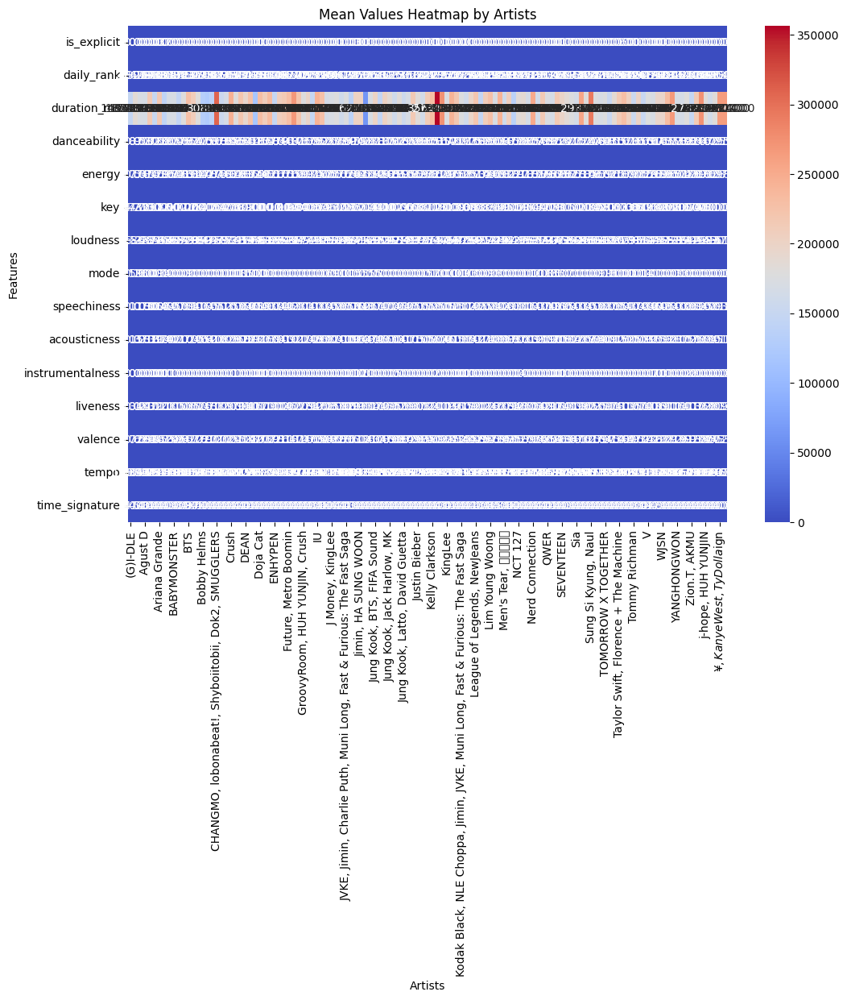

In [ ]:
# 데이터프레임을 transpose하고 'artists'를 인덱스로 설정
df_transposed = df_0.groupby('artists').mean().transpose()

# 히트맵 그리기
plt.figure(figsize=(12, 8))
sns.heatmap(df_transposed, cmap='coolwarm', annot=True, fmt=".2f")
plt.title('Mean Values Heatmap by Artists')
plt.xlabel('Artists')
plt.ylabel('Features')
plt.show()

In [ ]:
df_0.select_dtypes(include=['int','float']).corr()

,is_explicit,daily_rank,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
is_explicit,1.000000,-0.206956,0.276109,0.128380,0.052841,-0.131942,-0.045452,0.037489,0.190295,-0.265765,-0.014485,0.106604,-0.123799,0.032179,0.044737
daily_rank,-0.206956,1.000000,0.120848,-0.089577,-0.083405,-0.021589,-0.033844,0.089599,0.051442,0.017099,0.075427,-0.052267,-0.118515,0.098956,0.148884
duration_ms,0.276109,0.120848,1.000000,-0.244886,-0.054828,-0.122592,0.051253,0.110290,0.009605,-0.053979,-0.075788,0.120320,-0.391512,0.052404,-0.005853
danceability,0.128380,-0.089577,-0.244886,1.000000,0.264784,0.123113,0.285193,-0.149617,0.337784,-0.451466,0.019675,-0.184830,0.459236,-0.302025,0.383932
energy,0.052841,-0.083405,-0.054828,0.264784,1.000000,-0.001203,0.793148,-0.179387,0.258942,-0.681700,0.080655,0.117033,0.349964,0.196025,0.277595
key,-0.131942,-0.021589,-0.122592,0.123113,-0.001203,1.000000,-0.021630,-0.193621,0.224593,-0.096086,-0.073997,-0.135323,0.162499,-0.068270,0.047598
loudness,-0.045452,-0.033844,0.051253,0.285193,0.793148,-0.021630,1.000000,-0.106200,0.183297,-0.619834,-0.121261,0.122676,0.258449,0.099798,0.224890
mode,0.037489,0.089599,0.110290,-0.149617,-0.179387,-0.193621,-0.106200,1.000000,-0.176696,0.187317,0.091127,0.030090,-0.142673,-0.013605,-0.042770
speechiness,0.190295,0.051442,0.009605,0.337784,0.258942,0.224593,0.183297,-0.176696,1.000000,-0.270643,-0.104013,0.040135,0.110475,-0.026194,0.243031
acousticness,-0.265765,0.017099,-0.053979,-0.451466,-0.681700,-0.096086,-0.619834,0.187317,-0.270643,1.000000,0.009005,-0.025673,-0.256902,-0.101401,-0.360936


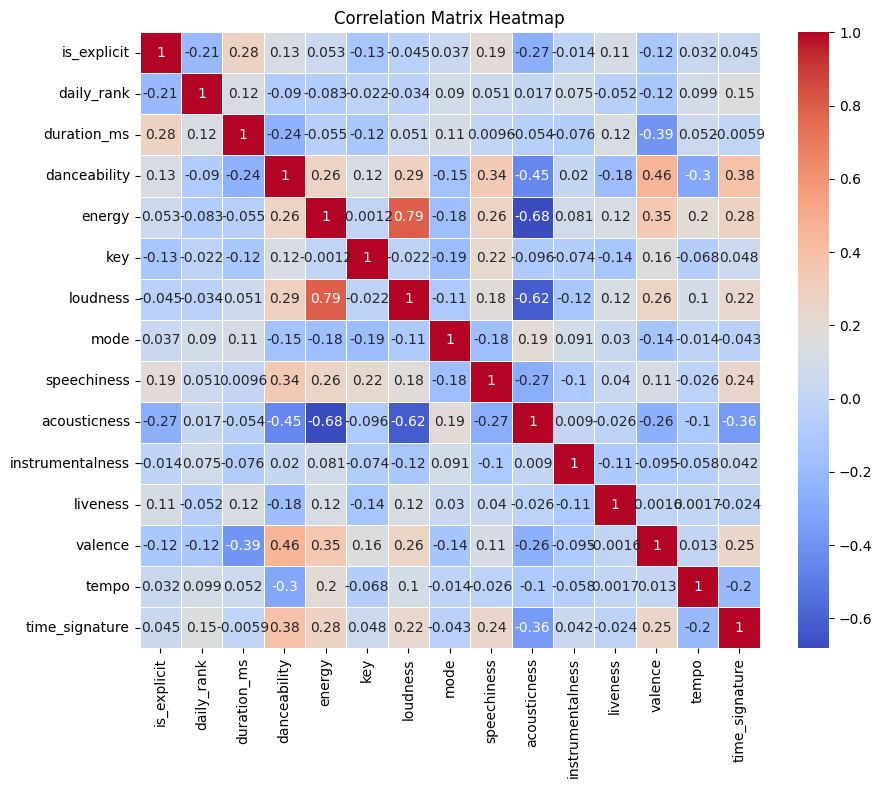

In [ ]:
# 정수 및 실수형 컬럼의 상관 행렬 계산
corr_matrix_2 = df_0.select_dtypes(include=['int', 'float']).corr()

# 히트맵 그리기
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix_2, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix Heatmap')
plt.show()

## Which song has the highest daily rank in KR? (X)

In [ ]:
highest_rank_song = df[df['daily_rank'] == 1].iloc[0]['name']
print("Highest Rank Song in KR:", highest_rank_song)

Highest Rank Song in KR: Like Crazy


## What are the most common genres/artists among the top trending songs?

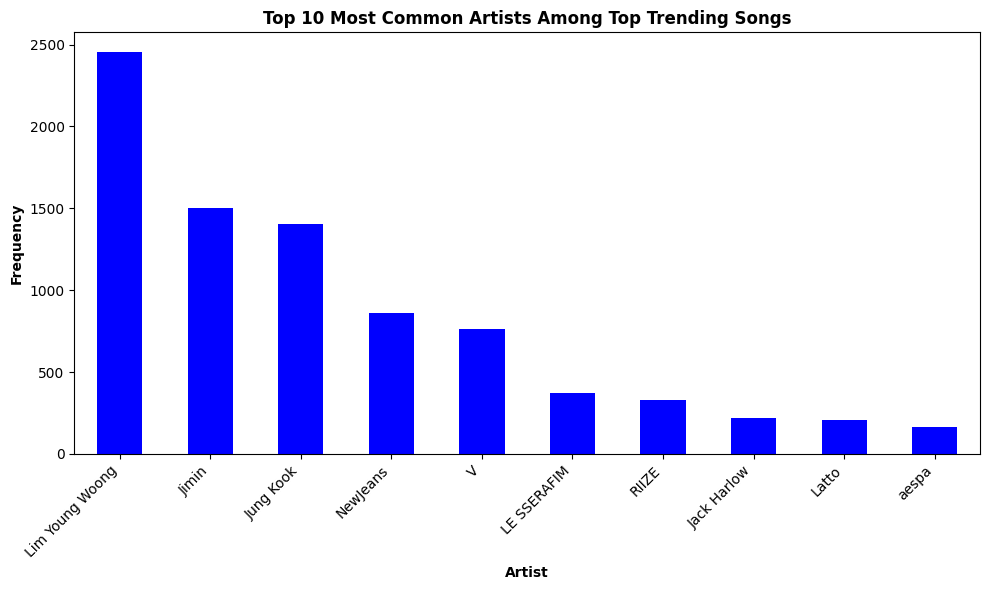

In [ ]:
artists_list = df['artists'].str.split(', ').explode()

# Count the occurence of each artist
artist_count = artists_list.value_counts()

# Top 10 most common artists
top_artists = artist_count.head(10)

# Plotting the chart
plt.figure(figsize=(10,6))
top_artists.plot(kind='bar', color = 'blue')
plt.title('Top 10 Most Common Artists Among Top Trending Songs',fontweight='bold')
plt.xlabel('Artist', fontweight='bold')
plt.ylabel('Frequency', fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

## How does the popularity of songs vary over time? (X)

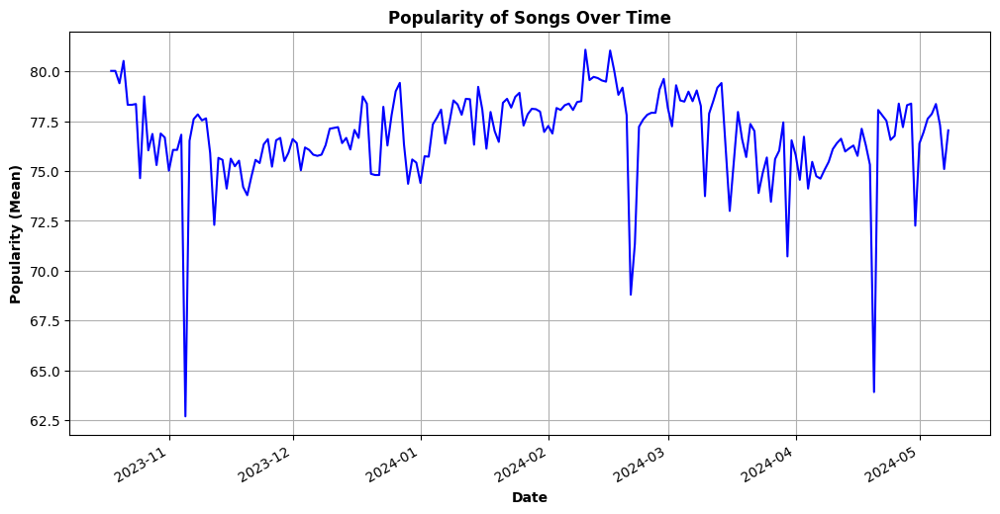

In [ ]:
#Convert snapshot_data to datatime format
df['snapshot_date'] =pd.to_datetime(df['snapshot_date'])

popularity_over_time = df.groupby('snapshot_date')['popularity'].mean()

#Plotting the chart
plt.figure(figsize=(12,6))
popularity_over_time.plot(color='b')
plt.title('Popularity of Songs Over Time', fontweight='bold')
plt.xlabel('Date', fontweight='bold')
plt.ylabel('Popularity (Mean)', fontweight='bold')
plt.grid(True)
plt.show()

## How does the daily rank of songs change over the week? (X)

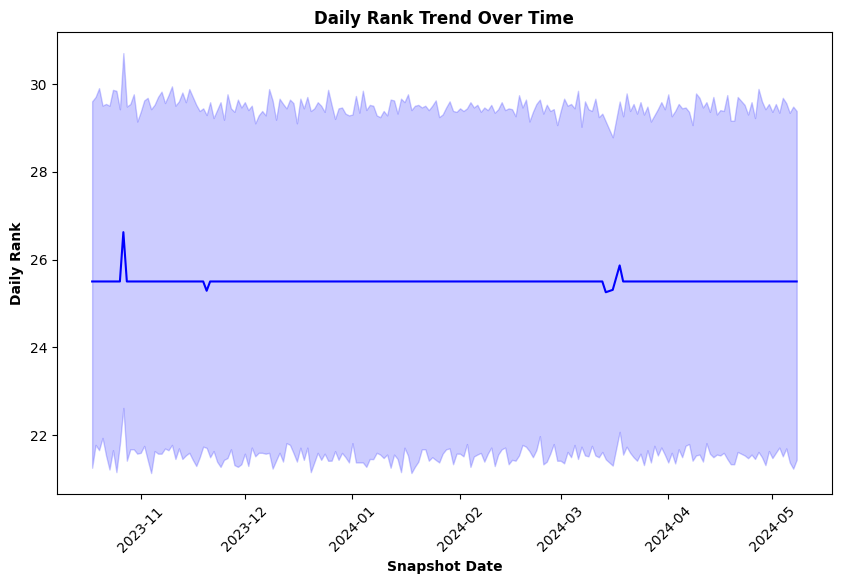

In [ ]:
plt.figure(figsize=(10,6))
sns.lineplot(x='snapshot_date', y='daily_rank', data=df, color='b')
plt.title('Daily Rank Trend Over Time', fontweight='bold')
plt.xlabel("Snapshot Date", fontweight='bold')
plt.ylabel('Daily Rank', fontweight='bold')
plt.xticks(rotation=45)
plt.show()

## Top 10 popular songs over the last 2 months

In [ ]:
# Filter the dataset for the specified date range ( 2024-03-01 to 2024-05-08)
start_date = pd.Timestamp(2024, 1, 1)
end_date = pd.Timestamp(2024, 5, 8)
filtered_data = df[(df['snapshot_date'] >= start_date) & (df['snapshot_date'] <= end_date)]

# Group by song and calculate the mean popularity for each song
popularity_per_song = filtered_data.groupby('name')['popularity'].mean()

#Sort the songs by polularity in descending order and select the top 10
top_10_songs = popularity_per_song.nlargest(10).reset_index()['name']

print("Top 10 Popular Songs from 2024-03-01 to 2024-05-08:")
print(top_10_songs)

Top 10 Popular Songs from 2024-03-01 to 2024-05-08:
0                                 Lovin On Me
1                       My Love Mine All Mine
2                  i like the way you kiss me
3                                Cruel Summer
4                        Standing Next to You
5    we can't be friends (wait for your love)
6                            Beautiful Things
7                                    Espresso
8                                  Like Crazy
9                        Bling-Bang-Bang-Born
Name: name, dtype: object


## Distribution of song duration

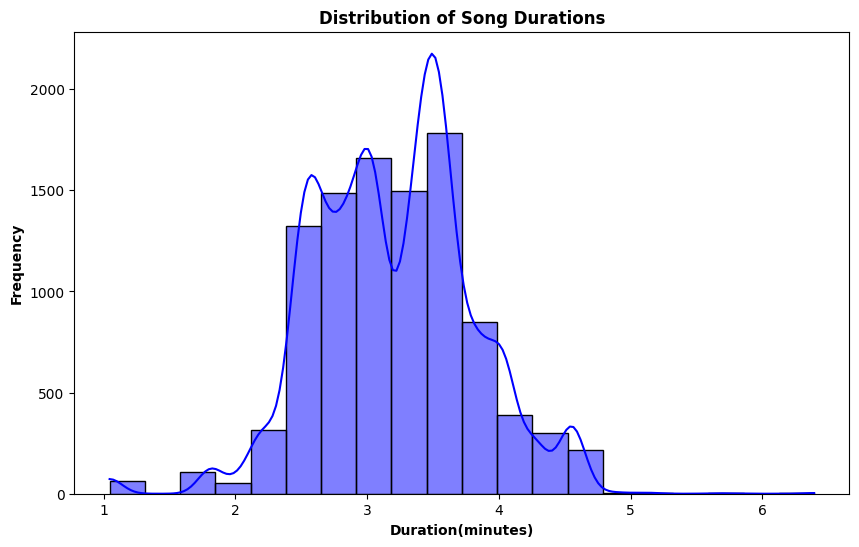

In [ ]:
plt.figure(figsize=(10,6))
sns.histplot(df['duration_ms'] / 60000, bins=20, kde=True, color='b' )
plt.xlabel('Duration(minutes)', fontweight='bold')
plt.ylabel('Frequency', fontweight='bold')
plt.title('Distribution of Song Durations', fontweight = 'bold')
plt.show()

## Relationship between danceability and energy

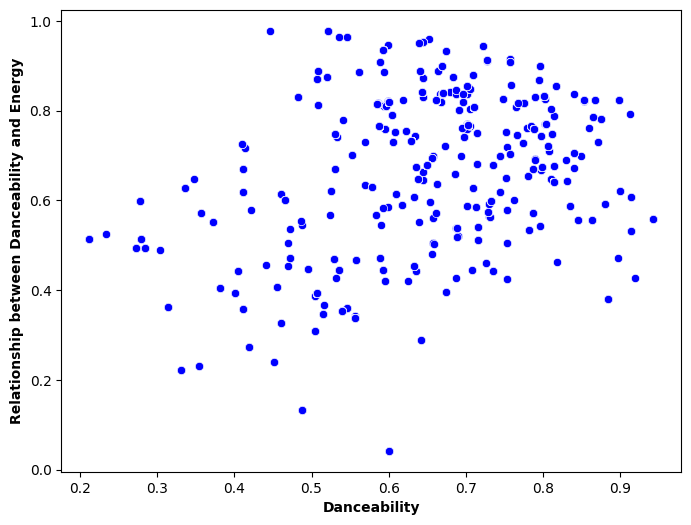

In [ ]:
plt.figure(figsize=(8,6))
sns.scatterplot(x='danceability', y='energy', data=df, color='b')
plt.xlabel('Danceability', fontweight='bold')
plt.ylabel('Relationship between Danceability and Energy', fontweight='bold')
plt.show()

## Box plot showing all cloumns across the rank of songs

<ipython-input-20-087807218d25>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = df['daily_rank'], y = distinct,


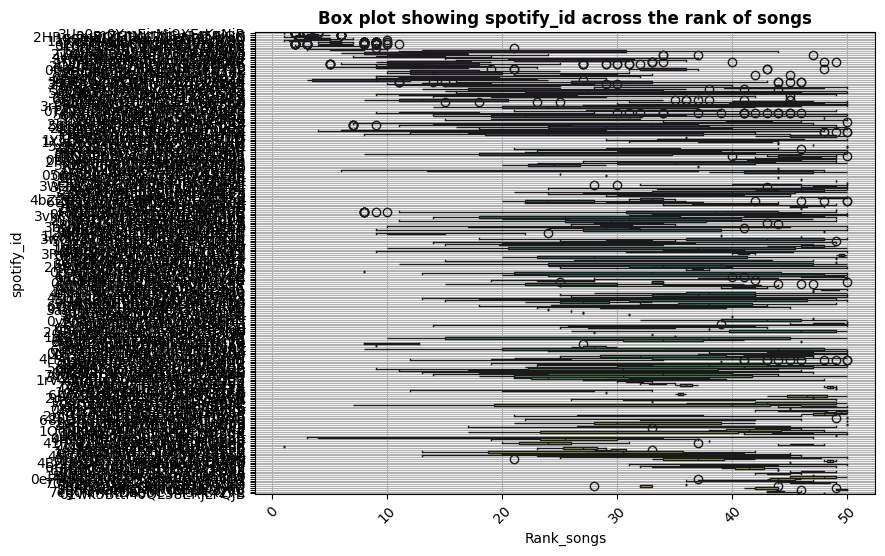

<ipython-input-20-087807218d25>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = df['daily_rank'], y = distinct,
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 54728 (\N{HANGUL SYLLABLE HEO}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 50980 (\N{HANGUL SYLLABLE YUN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51652 (\N{HANGUL SYLLABLE JIN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 22320 (\N{CJK UNIFIED IDEOGRAPH-5730}) missing from current font.

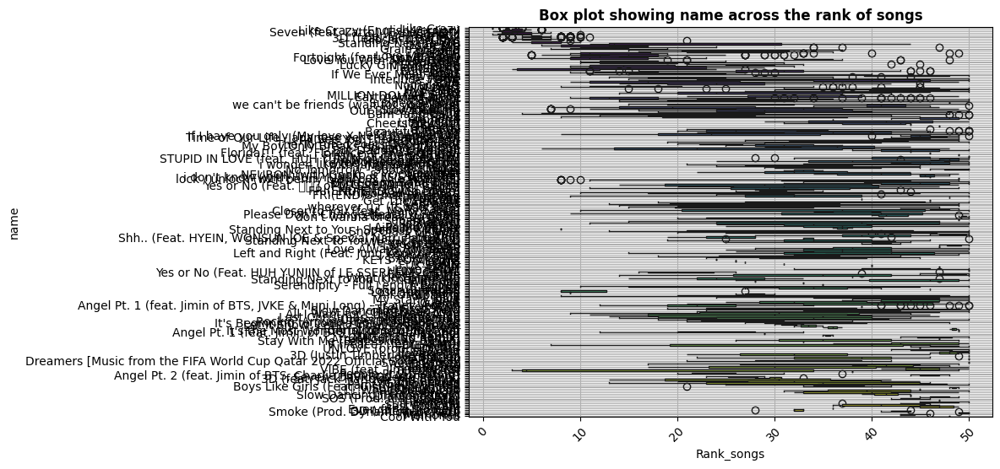

<ipython-input-20-087807218d25>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = df['daily_rank'], y = distinct,
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 48624 (\N{HANGUL SYLLABLE BYU}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 54000 (\N{HANGUL SYLLABLE TI}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 54400 (\N{HANGUL SYLLABLE PUL}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 45320 (\N{HANGUL SYLLABLE NEO}) missing from current font.
  fig.c

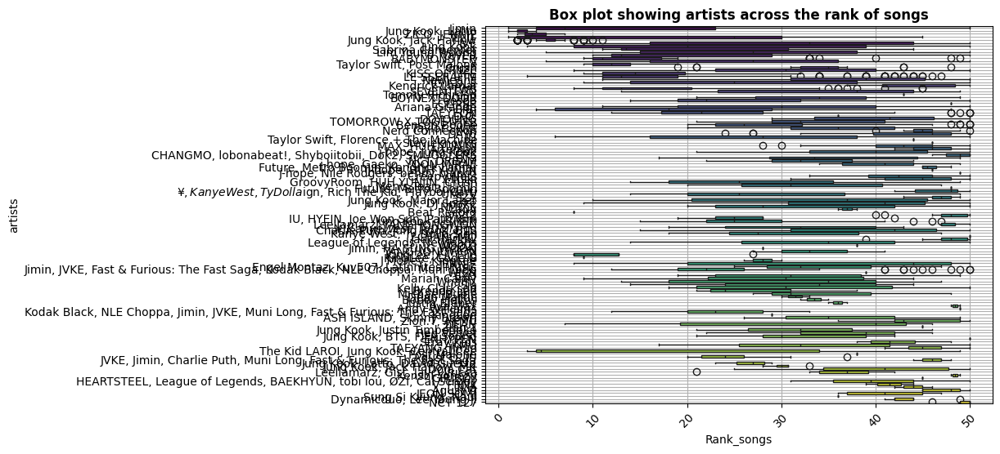

<ipython-input-20-087807218d25>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = df['daily_rank'], y = distinct,


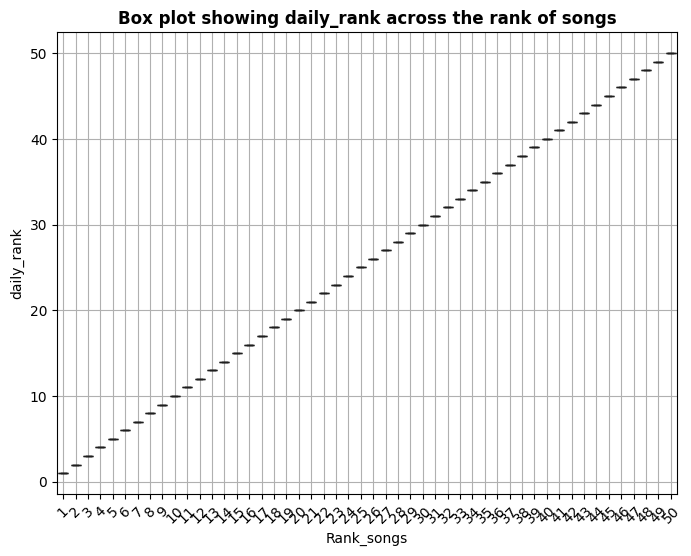

<ipython-input-20-087807218d25>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = df['daily_rank'], y = distinct,


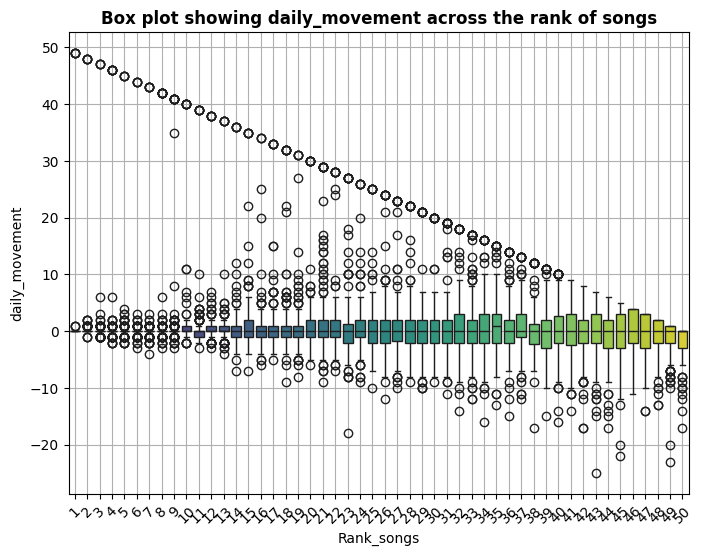

<ipython-input-20-087807218d25>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = df['daily_rank'], y = distinct,


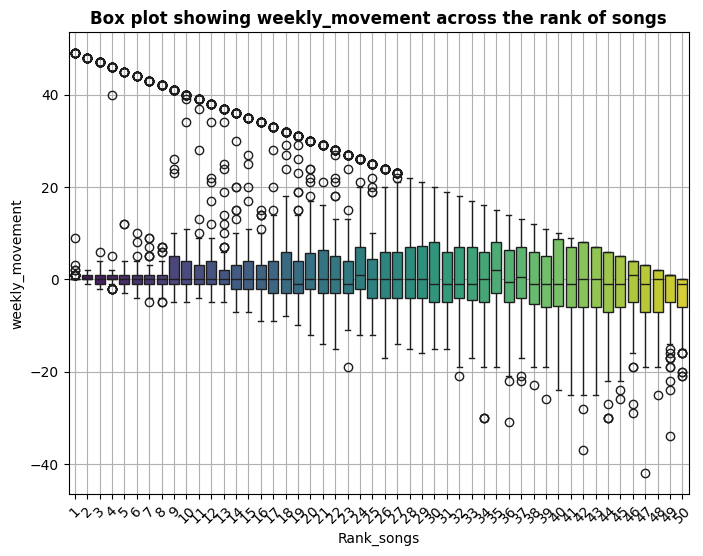

<ipython-input-20-087807218d25>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = df['daily_rank'], y = distinct,


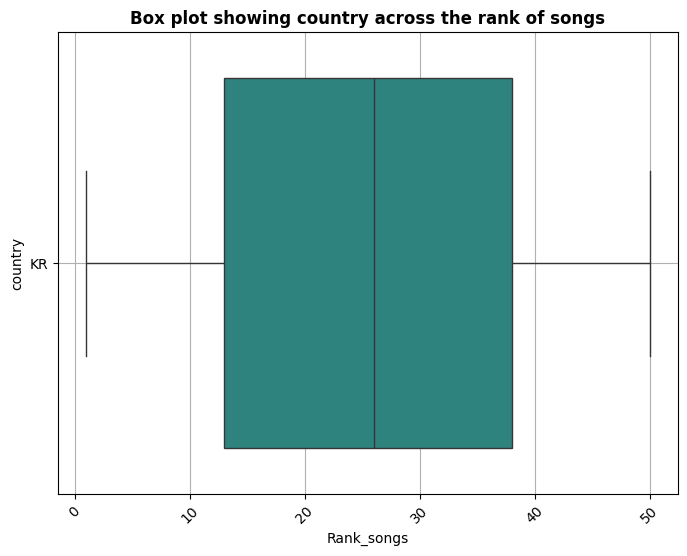

<ipython-input-20-087807218d25>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = df['daily_rank'], y = distinct,


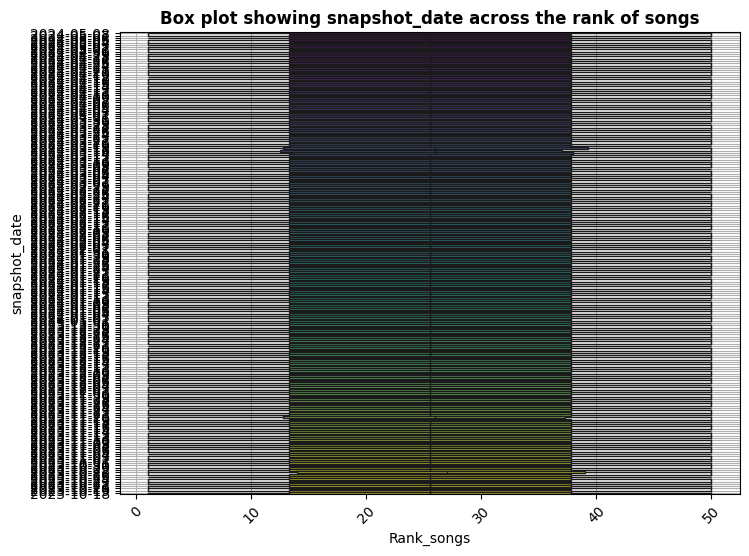

<ipython-input-20-087807218d25>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = df['daily_rank'], y = distinct,


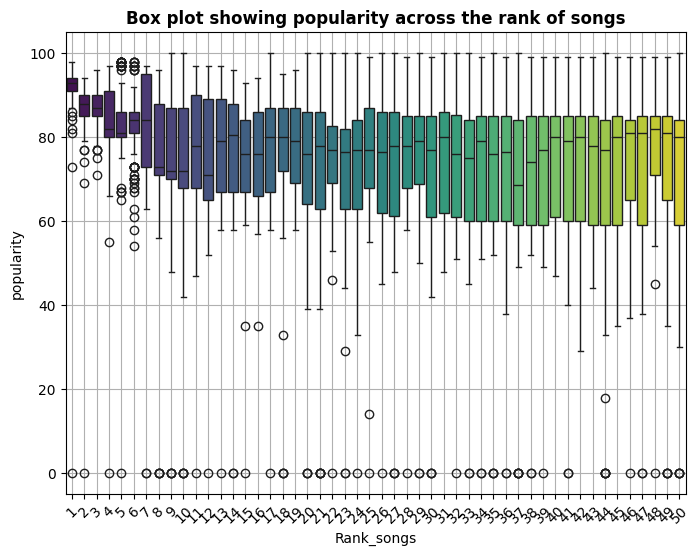

<ipython-input-20-087807218d25>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = df['daily_rank'], y = distinct,


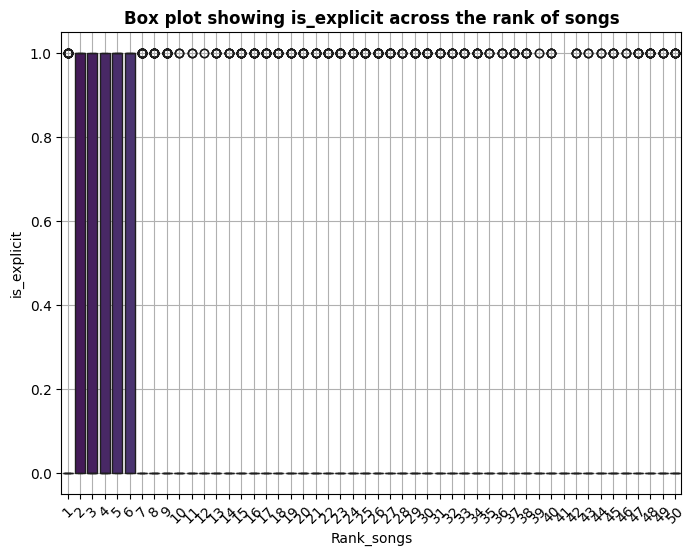

<ipython-input-20-087807218d25>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = df['daily_rank'], y = distinct,


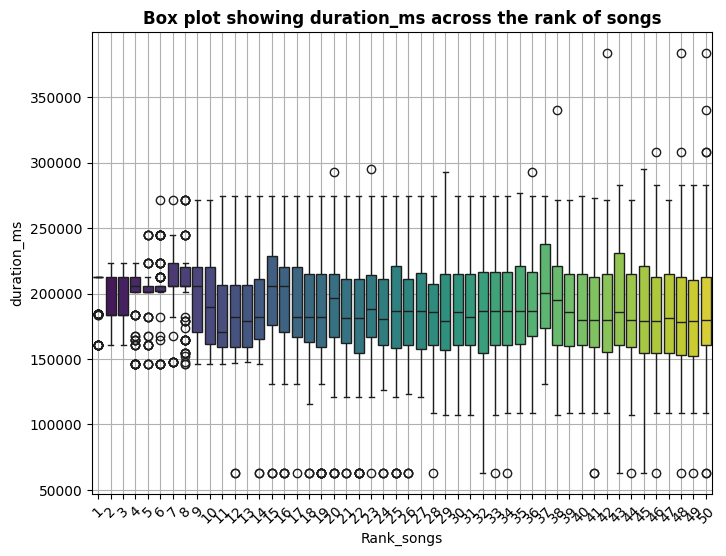

<ipython-input-20-087807218d25>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = df['daily_rank'], y = distinct,
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 32080 (\N{CJK UNIFIED IDEOGRAPH-7D50}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 22320 (\N{CJK UNIFIED IDEOGRAPH-5730}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 29699 (\N{CJK UNIFIED IDEOGRAPH-7403}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 20736 (\N{CJK UNIFIED IDEOGRAPH-5100}) missi

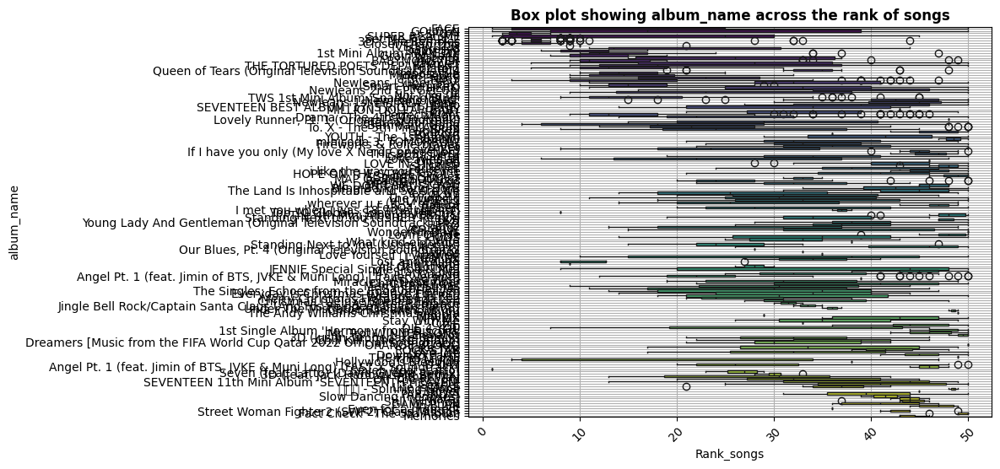

<ipython-input-20-087807218d25>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = df['daily_rank'], y = distinct,


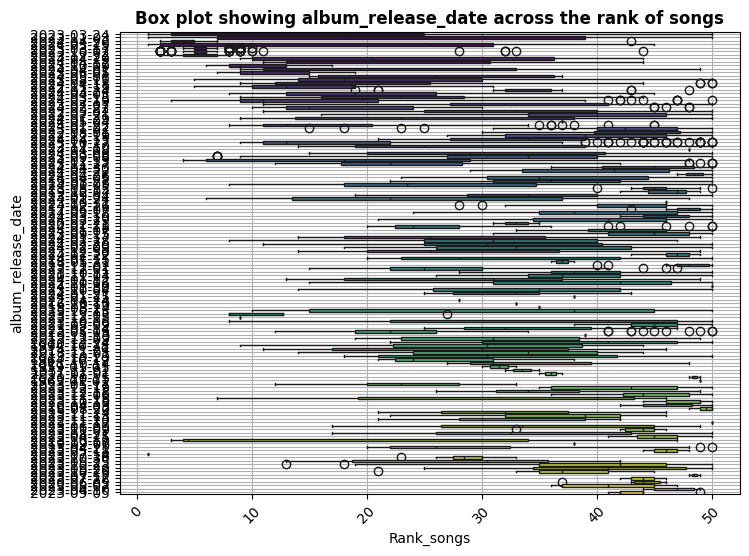

<ipython-input-20-087807218d25>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = df['daily_rank'], y = distinct,


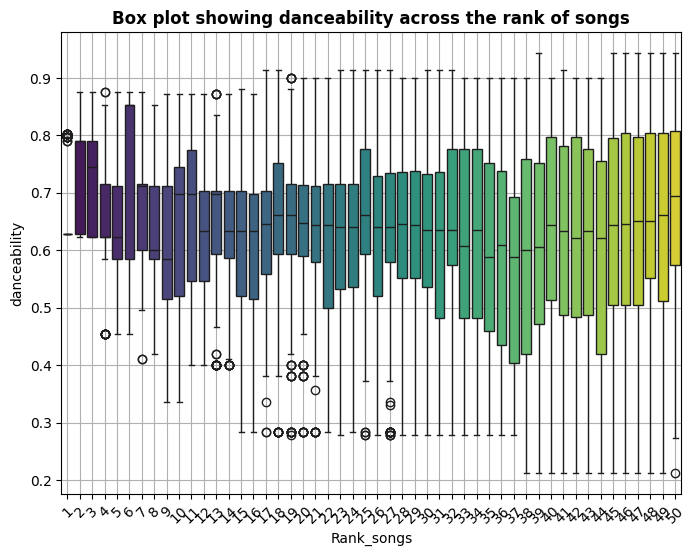

<ipython-input-20-087807218d25>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = df['daily_rank'], y = distinct,


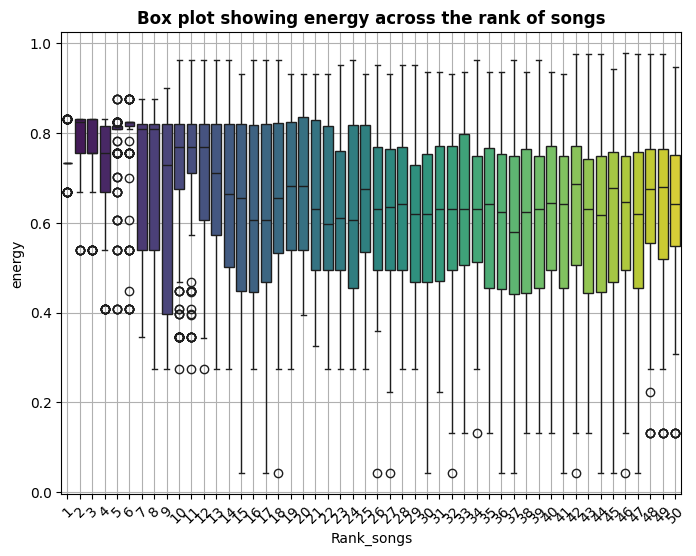

<ipython-input-20-087807218d25>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = df['daily_rank'], y = distinct,


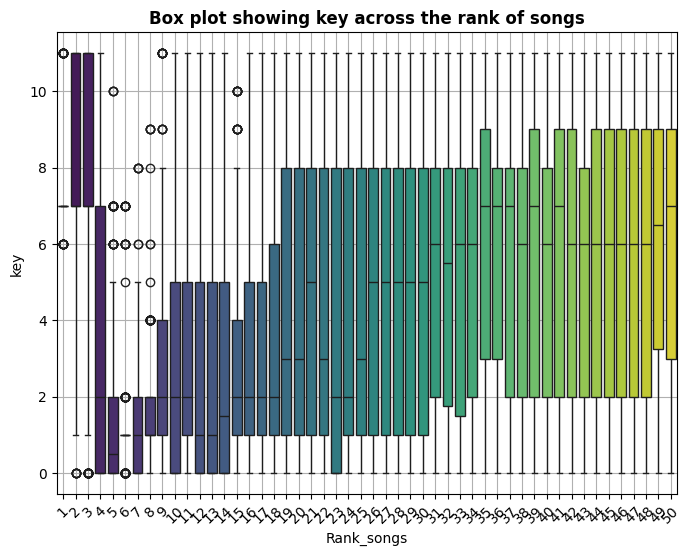

<ipython-input-20-087807218d25>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = df['daily_rank'], y = distinct,


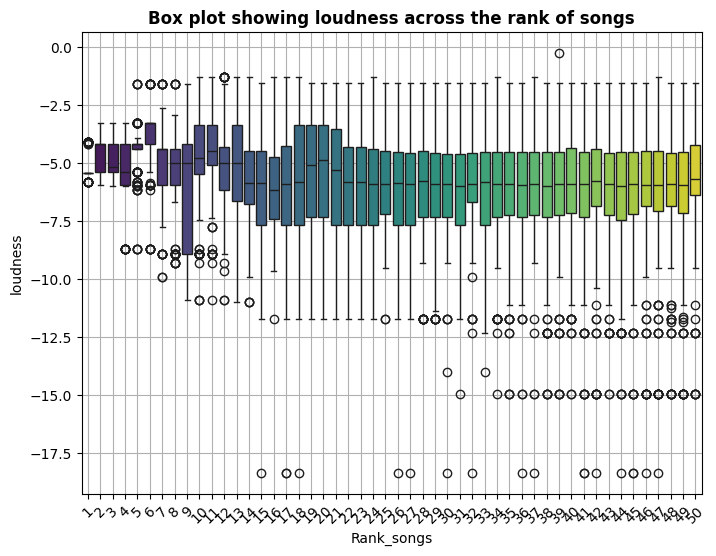

<ipython-input-20-087807218d25>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = df['daily_rank'], y = distinct,


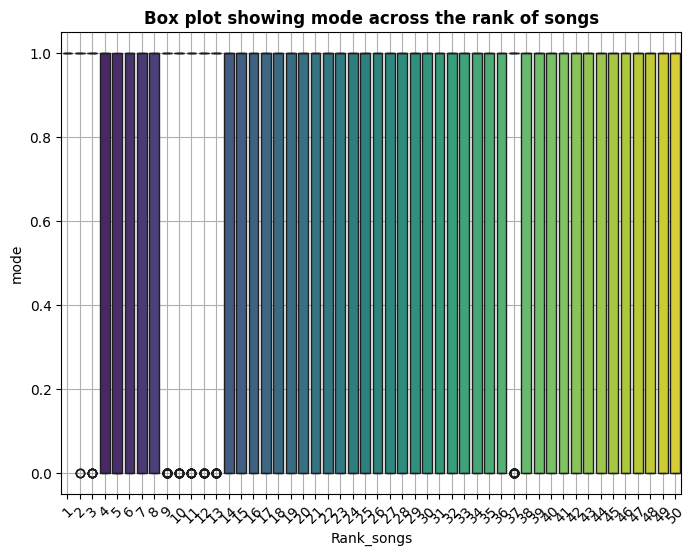

<ipython-input-20-087807218d25>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = df['daily_rank'], y = distinct,


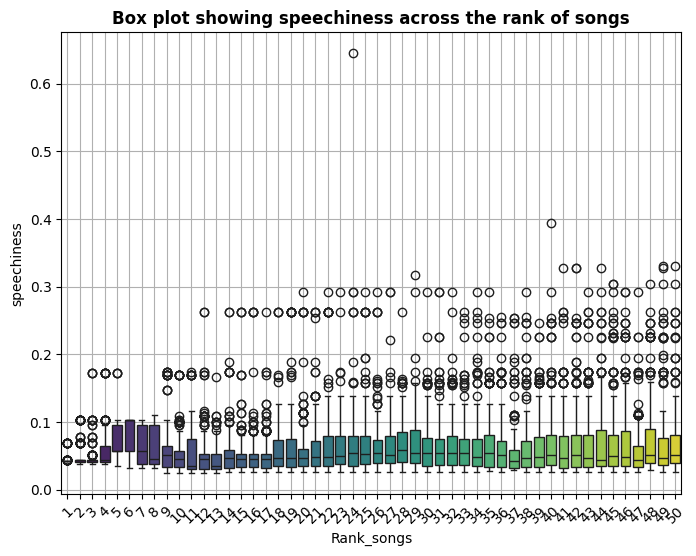

<ipython-input-20-087807218d25>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = df['daily_rank'], y = distinct,


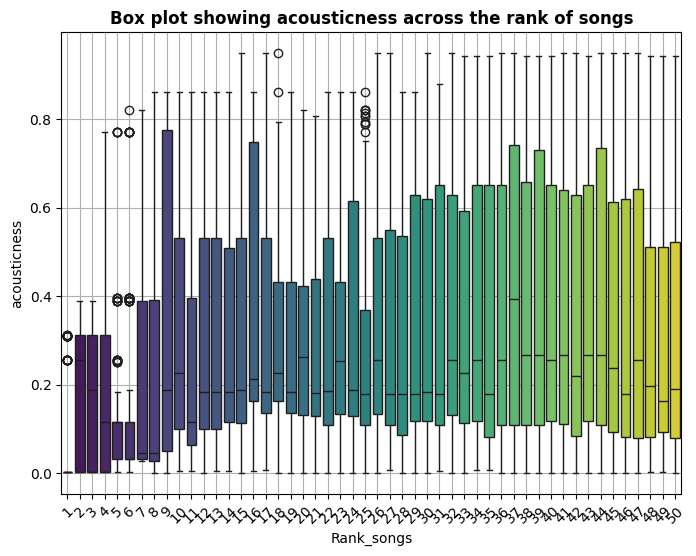

<ipython-input-20-087807218d25>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = df['daily_rank'], y = distinct,


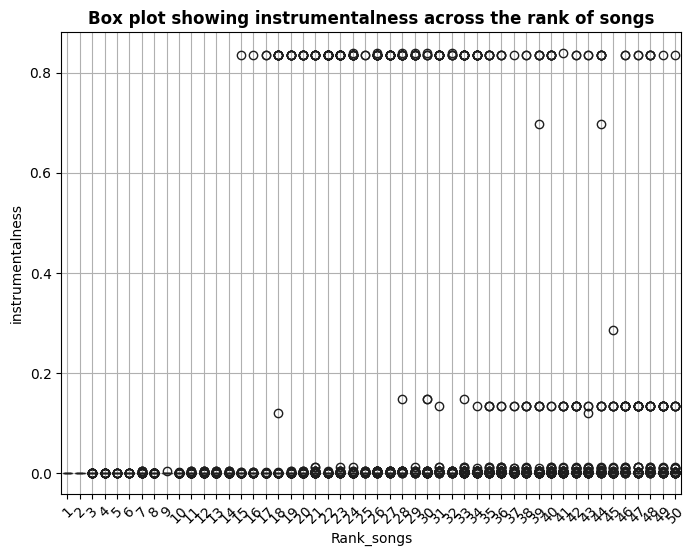

<ipython-input-20-087807218d25>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = df['daily_rank'], y = distinct,


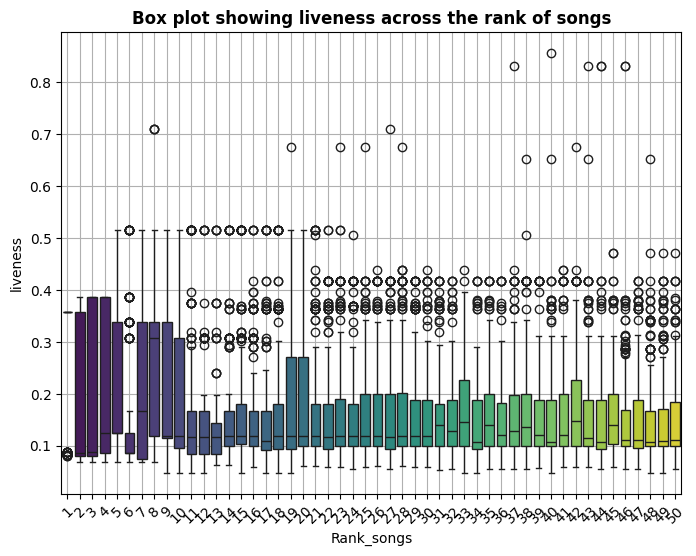

<ipython-input-20-087807218d25>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = df['daily_rank'], y = distinct,


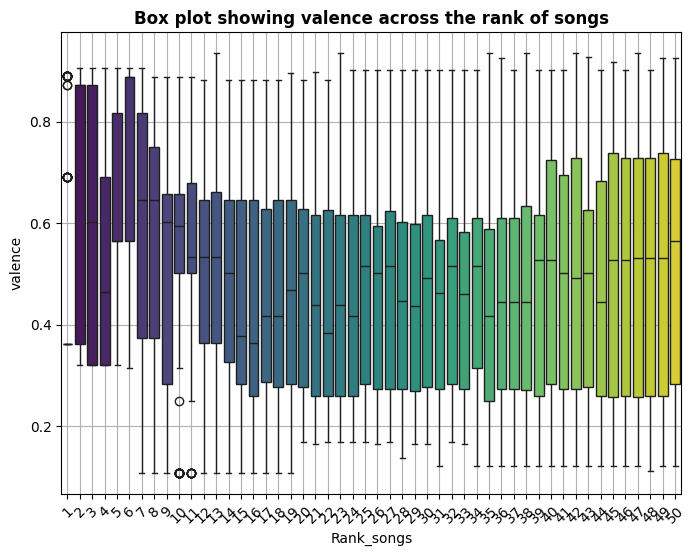

<ipython-input-20-087807218d25>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = df['daily_rank'], y = distinct,


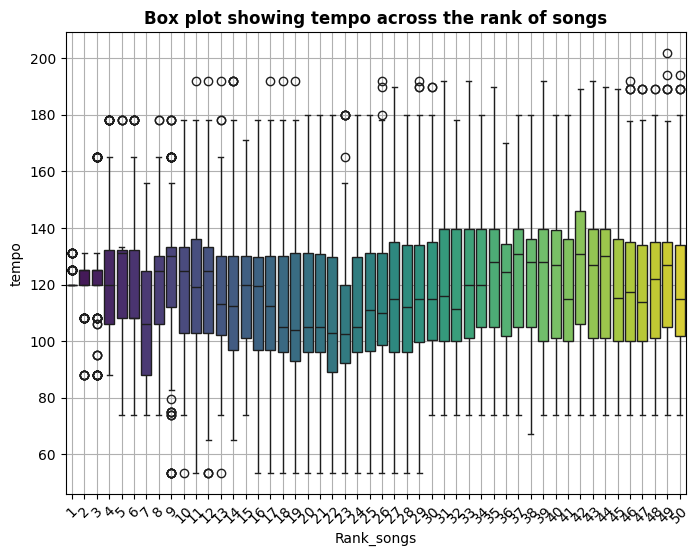

<ipython-input-20-087807218d25>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = df['daily_rank'], y = distinct,


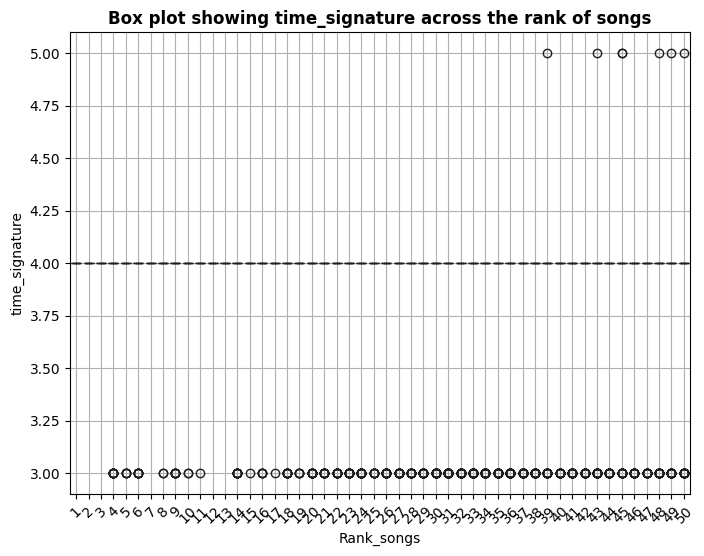

In [ ]:
# 'daily_rank'의 등수별로 그룹화한 것을 기준으로 컬럼별 box plot 생성


def show_boxplot(distinct, df):
    plt.figure(figsize=(8,6))
    sns.boxplot(x = df['daily_rank'], y = distinct,
                data=df, palette='viridis')
    plt.title(f'Box plot showing {distinct} across the rank of songs', fontweight='bold')
    plt.xlabel('Rank_songs')
    plt.ylabel(distinct)
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.show()
for i in df.columns:
    show_boxplot(i,df)

In [ ]:
first_song = df[df['daily_rank'] == 1]['danceability']
first_song.unique()

array([0.629, 0.797, 0.79 , 0.802])

In [ ]:
len(df.columns)

25

In [ ]:
df.columns

Index(['spotify_id', 'name', 'artists', 'daily_rank', 'daily_movement',
       'weekly_movement', 'country', 'snapshot_date', 'popularity',
       'is_explicit', 'duration_ms', 'album_name', 'album_release_date',
       'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'time_signature'],
      dtype='object')

# 데이터 정제

In [ ]:
grouped_df = df.groupby('snapshot_date').count()

In [ ]:
len(grouped_df['spotify_id'])

201

In [ ]:
grouped_df = grouped_df.loc[grouped_df['spotify_id']  != 50]
grouped_df

,spotify_id,name,artists,daily_rank,daily_movement,weekly_movement,country,popularity,is_explicit,duration_ms,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
snapshot_date,,,,,,,,,,,,,,,,,,,,,
2023-10-27,53,53,53,53,53,53,53,53,53,53,...,53,53,53,53,53,53,53,53,53,53
2023-11-20,52,52,52,52,52,52,52,52,52,52,...,52,52,52,52,52,52,52,52,52,52
2024-03-14,51,51,51,51,51,51,51,51,51,51,...,51,51,51,51,51,51,51,51,51,51
2024-03-16,55,55,55,55,55,55,55,55,55,55,...,55,55,55,55,55,55,55,55,55,55
2024-03-18,52,52,52,52,52,52,52,52,52,52,...,52,52,52,52,52,52,52,52,52,52


In [ ]:
specific_group = grouped_df.loc['2023-10-27']
print(specific_group)

spotify_id            53
name                  53
artists               53
daily_rank            53
daily_movement        53
weekly_movement       53
country               53
popularity            53
is_explicit           53
duration_ms           53
album_name            53
album_release_date    53
danceability          53
energy                53
key                   53
loudness              53
mode                  53
speechiness           53
acousticness          53
instrumentalness      53
liveness              53
valence               53
tempo                 53
time_signature        53
Name: 2023-10-27 00:00:00, dtype: int64


In [ ]:
# 'snapshot_date'를 기준으로 groupby한 후에 각 그룹에서 최대 50개의 행을 선택
limited_df = df.groupby('snapshot_date').head(50)

In [ ]:
limited_df

,spotify_id,name,artists,daily_rank,daily_movement,weekly_movement,country,snapshot_date,popularity,is_explicit,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,3Ua0m0YmEjrMi9XErKcNiR,Like Crazy,Jimin,1,0,0,KR,2024-05-08,90,False,...,7,-5.445,1,0.0419,0.00250,0.000000,0.3570,0.362,120.001,4
1,0u8rZGtXJrLtiSe34FPjGG,Like Crazy (English Version),Jimin,2,1,2,KR,2024-05-08,77,False,...,7,-5.386,1,0.0415,0.00306,0.000000,0.3870,0.320,119.957,4
2,2HRgqmZQC0MC7GeNuDIXHN,Seven (feat. Latto) (Explicit Ver.),"Jung Kook, Latto",3,-1,-1,KR,2024-05-08,86,True,...,11,-4.185,1,0.0440,0.31200,0.000000,0.0797,0.872,124.987,4
3,1SS0WlKhJewviwEDZ6dWj0,SPOT!,"ZICO, JENNIE",4,2,-1,KR,2024-05-08,84,False,...,5,-3.905,0,0.0780,0.15100,0.000000,0.1130,0.906,108.038,4
4,1aKvZDoLGkNMxoRYgkckZG,Magnetic,ILLIT,5,-1,0,KR,2024-05-08,93,False,...,6,-5.819,1,0.0687,0.25700,0.000000,0.0876,0.690,131.067,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10058,0eFMbKCRw8KByXyWBw8WO7,Still With You,Jung Kook,46,4,0,KR,2023-10-18,84,False,...,1,-6.967,0,0.0358,0.08990,0.000015,0.8310,0.344,87.864,4
10059,4Cr43xPo7bwyCcL1g3yVCu,A bientot,Lim Young Woong,47,3,0,KR,2023-10-18,58,False,...,0,-4.555,1,0.0804,0.26800,0.000000,0.2710,0.527,73.967,4
10060,02wk5BttM0QL38ERjLPQJB,Cool With You,NewJeans,48,2,0,KR,2023-10-18,85,False,...,5,-6.683,0,0.1200,0.65300,0.001360,0.1050,0.532,134.993,4
10061,1BxfuPKGuaTgP7aM0Bbdwr,Cruel Summer,Taylor Swift,49,1,0,KR,2023-10-18,99,False,...,9,-5.707,1,0.1570,0.11700,0.000021,0.1050,0.564,169.994,4


In [ ]:
len(limited_df.loc[limited_df['snapshot_date'] == '2023-10-27'])

50

In [ ]:
# 50개의 행으로 이루어진 일자의 랭킹의 인덱싱이 순서대로 잘 되어있는지 확인
df.loc[df['snapshot_date'] == '2024-03-14'] # 중복된 인덱싱 넘버 확인됨 -> 새로운 인덱스 넘버 부여 필요

,spotify_id,name,artists,daily_rank,daily_movement,weekly_movement,country,snapshot_date,popularity,is_explicit,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
2607,3Ua0m0YmEjrMi9XErKcNiR,Like Crazy,Jimin,1,0,0,KR,2024-03-14,91,False,...,7,-5.445,1,0.0419,0.00250,0.000000,0.3570,0.362,120.001,4
2608,2HRgqmZQC0MC7GeNuDIXHN,Seven (feat. Latto) (Explicit Ver.),"Jung Kook, Latto",2,0,0,KR,2024-03-14,88,True,...,11,-4.185,1,0.0440,0.31200,0.000000,0.0797,0.872,124.987,4
2609,0u8rZGtXJrLtiSe34FPjGG,Like Crazy (English Version),Jimin,3,0,1,KR,2024-03-14,79,False,...,7,-5.386,1,0.0415,0.00306,0.000000,0.3870,0.320,119.957,4
2610,2O4Bb2WCkjlTPO827OnBMI,EASY,LE SSERAFIM,3,1,0,KR,2024-03-14,89,False,...,0,-5.154,1,0.0507,0.18900,0.000003,0.1140,0.602,165.004,4
2611,59hBR0BCtJsfIbV9VzCVAp,Set Me Free Pt.2,Jimin,5,1,3,KR,2024-03-14,78,True,...,0,-4.165,0,0.0565,0.11500,0.000000,0.1240,0.564,132.090,4
2612,2KslE17cAJNHTsI2MI0jb2,Standing Next to You,Jung Kook,5,3,4,KR,2024-03-14,93,False,...,2,-4.389,0,0.0955,0.04470,0.000000,0.3390,0.816,106.017,4
2613,01qFKNWq73UfEslI0GvumE,3D (feat. Jack Harlow),"Jung Kook, Jack Harlow",6,-1,-1,KR,2024-03-14,83,True,...,1,-3.287,1,0.1030,0.03220,0.000000,0.0859,0.888,108.044,4
2614,3k6q0O9JnO2GhvD6C8fs20,Closer Than This,Jimin,7,0,0,KR,2024-03-14,86,False,...,0,-5.951,1,0.0381,0.38900,0.000000,0.0692,0.373,87.963,4
2615,4lR8sYGMGZPvthF2yUfo7T,Smart,LE SSERAFIM,9,1,2,KR,2024-03-14,87,False,...,1,-5.474,1,0.0465,0.11500,0.000000,0.0833,0.594,113.076,4
2616,5juCu4WFTFRZ2XilopAMTy,Bam Yang Gang,BIBI,10,-1,-4,KR,2024-03-14,77,False,...,6,-8.720,0,0.0642,0.77100,0.000066,0.0958,0.743,178.047,3


In [ ]:
# 'snapshot_date'를 기준으로 그룹화한 후에 각 그룹에서 인덱스를 리셋하고 순차적인 값을 설정
# cumcount() 메서드는 각 그룹 내에서 현재 행의 순서를 나타내는 순차적인 값을 생성
limited_df['new_daily_rank'] = limited_df.groupby('snapshot_date').cumcount() + 1
limited_df.drop(columns=['daily_rank'], inplace=True)
limited_df.groupby('snapshot_date').count()

<ipython-input-32-48f7397c08f8>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  limited_df['new_daily_rank'] = limited_df.groupby('snapshot_date').cumcount() + 1
<ipython-input-32-48f7397c08f8>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  limited_df.drop(columns=['daily_rank'], inplace=True)


,spotify_id,name,artists,daily_movement,weekly_movement,country,popularity,is_explicit,duration_ms,album_name,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,new_daily_rank
snapshot_date,,,,,,,,,,,,,,,,,,,,,
2023-10-18,50,50,50,50,50,50,50,50,50,50,...,50,50,50,50,50,50,50,50,50,50
2023-10-19,50,50,50,50,50,50,50,50,50,50,...,50,50,50,50,50,50,50,50,50,50
2023-10-20,50,50,50,50,50,50,50,50,50,50,...,50,50,50,50,50,50,50,50,50,50
2023-10-21,50,50,50,50,50,50,50,50,50,50,...,50,50,50,50,50,50,50,50,50,50
2023-10-22,50,50,50,50,50,50,50,50,50,50,...,50,50,50,50,50,50,50,50,50,50
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-04,50,50,50,50,50,50,50,50,50,50,...,50,50,50,50,50,50,50,50,50,50
2024-05-05,50,50,50,50,50,50,50,50,50,50,...,50,50,50,50,50,50,50,50,50,50
2024-05-06,50,50,50,50,50,50,50,50,50,50,...,50,50,50,50,50,50,50,50,50,50


In [ ]:
len(limited_df)

10050

In [ ]:
# 결측치 중복값 제거
limited_df1=limited_df.copy()
#drop the null values
limited_df1.dropna(inplace=True)
#drop the duplicate rows
limited_df1.drop_duplicates(inplace=True)
#show the dataframe
len(limited_df1)

10050

In [ ]:
df = limited_df.copy()
df.head()

,spotify_id,name,artists,daily_movement,weekly_movement,country,snapshot_date,popularity,is_explicit,duration_ms,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,new_daily_rank
0,3Ua0m0YmEjrMi9XErKcNiR,Like Crazy,Jimin,0,0,KR,2024-05-08,90,False,212241,...,-5.445,1,0.0419,0.00250,0.0,0.3570,0.362,120.001,4,1
1,0u8rZGtXJrLtiSe34FPjGG,Like Crazy (English Version),Jimin,1,2,KR,2024-05-08,77,False,212253,...,-5.386,1,0.0415,0.00306,0.0,0.3870,0.320,119.957,4,2
2,2HRgqmZQC0MC7GeNuDIXHN,Seven (feat. Latto) (Explicit Ver.),"Jung Kook, Latto",-1,-1,KR,2024-05-08,86,True,183550,...,-4.185,1,0.0440,0.31200,0.0,0.0797,0.872,124.987,4,3
3,1SS0WlKhJewviwEDZ6dWj0,SPOT!,"ZICO, JENNIE",2,-1,KR,2024-05-08,84,False,167706,...,-3.905,0,0.0780,0.15100,0.0,0.1130,0.906,108.038,4,4
4,1aKvZDoLGkNMxoRYgkckZG,Magnetic,ILLIT,-1,0,KR,2024-05-08,93,False,160688,...,-5.819,1,0.0687,0.25700,0.0,0.0876,0.690,131.067,4,5


## Feature selection and transforming

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/spotify_KR.csv')

grouped_df = df.groupby('snapshot_date')

limited_df = df.groupby('snapshot_date').head(50)
limited_df['new_daily_rank'] = limited_df.groupby('snapshot_date').cumcount() + 1
limited_df.drop(columns=['daily_rank'], inplace=True)
limited_df.groupby('snapshot_date')

df = limited_df.copy()

<ipython-input-36-d8cf6a7d73ed>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  limited_df['new_daily_rank'] = limited_df.groupby('snapshot_date').cumcount() + 1
<ipython-input-36-d8cf6a7d73ed>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  limited_df.drop(columns=['daily_rank'], inplace=True)


In [ ]:
def top_what(row):
    '''this function returns the category of the song based on its daily rank'''
    if row.new_daily_rank <= 20:
        cat = 'top20'
    else:
        cat = 'average'
    return cat

In [ ]:
#apply the function to the dataframe
df['target']=df.apply(top_what, axis = 1)

In [ ]:
df.columns

Index(['spotify_id', 'name', 'artists', 'daily_movement', 'weekly_movement',
       'country', 'snapshot_date', 'popularity', 'is_explicit', 'duration_ms',
       'album_name', 'album_release_date', 'danceability', 'energy', 'key',
       'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness',
       'liveness', 'valence', 'tempo', 'time_signature', 'new_daily_rank',
       'target'],
      dtype='object')

In [ ]:
#drop the columns that are not needed
df = df[['is_explicit', 'duration_ms','danceability', 'energy', 'key', 'loudness',
       'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'time_signature', 'target']]

# Preprocessing

In [ ]:
#Create the feature matrix and the target variable
X = df[df.columns[:-1]]
y = df[df.columns[-1]]
X

,is_explicit,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,False,212241,0.629,0.733,7,-5.445,1,0.0419,0.00250,0.000000,0.3570,0.362,120.001,4
1,False,212253,0.623,0.755,7,-5.386,1,0.0415,0.00306,0.000000,0.3870,0.320,119.957,4
2,True,183550,0.790,0.831,11,-4.185,1,0.0440,0.31200,0.000000,0.0797,0.872,124.987,4
3,False,167706,0.875,0.782,5,-3.905,0,0.0780,0.15100,0.000000,0.1130,0.906,108.038,4
4,False,160688,0.797,0.668,6,-5.819,1,0.0687,0.25700,0.000000,0.0876,0.690,131.067,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10058,False,239905,0.529,0.469,1,-6.967,0,0.0358,0.08990,0.000015,0.8310,0.344,87.864,4
10059,False,256372,0.606,0.729,0,-4.555,1,0.0804,0.26800,0.000000,0.2710,0.527,73.967,4
10060,False,147880,0.752,0.650,5,-6.683,0,0.1200,0.65300,0.001360,0.1050,0.532,134.993,4
10061,False,178426,0.552,0.702,9,-5.707,1,0.1570,0.11700,0.000021,0.1050,0.564,169.994,4


In [ ]:
# Instantiate the LabelEncoder
label_encoder = LabelEncoder()

#Fit it to the target
label_encoder.fit(y)

#Find the encoded classes
print(f"The Label Encoder has encoded {label_encoder.classes_}")

#Transform the targets
encoded_target = label_encoder.transform(y)
encoded_target

The Label Encoder has encoded ['average' 'top20']


array([1, 1, 1, ..., 0, 0, 0])

In [ ]:
label_encoder.classes_

array(['average', 'top20'], dtype=object)

In [ ]:
#train test split
X_train, X_test, y_train, y_test = train_test_split(X,encoded_target, test_size=0.3, random_state=88)

<ipython-input-45-d2bf1c6a647e>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=y, palette='Set2')


<Axes: xlabel='target', ylabel='count'>

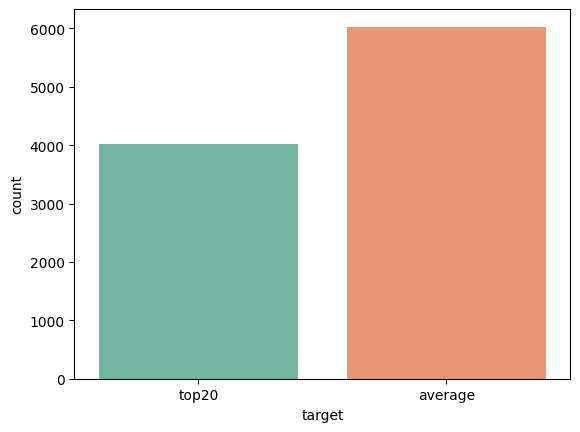

In [ ]:
#check the balance of the target variable
sns.countplot(x=y, palette='Set2')

# Data Modeling

## Baseline model

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/spotify_KR.csv')

grouped_df = df.groupby('snapshot_date')

limited_df = df.groupby('snapshot_date').head(50)
limited_df['new_daily_rank'] = limited_df.groupby('snapshot_date').cumcount() + 1
limited_df.drop(columns=['daily_rank'], inplace=True)
limited_df.groupby('snapshot_date')

df = limited_df.copy()

#this function returns the category of the song based on its daily rank
def top_what(row):
    if row.new_daily_rank <= 20:
        cat = 'top20'
    else:
        cat = 'average'
    return cat

#apply the function to the dataframe
df['target']=df.apply(top_what, axis = 1)

#drop the columns that are not needed
df = df[['is_explicit', 'duration_ms','danceability', 'energy', 'key', 'loudness',
       'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'time_signature', 'target']]

#Create the feature matrix and the target variable
X = df[df.columns[:-1]]
y = df[df.columns[-1]]


# Instantiate the LabelEncoder
label_encoder = LabelEncoder()

#Fit it to the target
label_encoder.fit(y)

#Find the encoded classes
print(f"The Label Encoder has encoded {label_encoder.classes_}")

#Transform the targets
encoded_target = label_encoder.transform(y)

#train test split
X_train, X_test, y_train, y_test = train_test_split(X,encoded_target, test_size=0.3, random_state=88)

The Label Encoder has encoded ['average' 'top20']


<ipython-input-46-c560c85f0634>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  limited_df['new_daily_rank'] = limited_df.groupby('snapshot_date').cumcount() + 1
<ipython-input-46-c560c85f0634>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  limited_df.drop(columns=['daily_rank'], inplace=True)


In [ ]:
#Create a pipeline
num_transformer = make_pipeline(SimpleImputer(), StandardScaler())
num_col = make_column_selector(dtype_include=['float64', 'int64'])

cat_transformer = OneHotEncoder(sparse_output=False)
cat_col = make_column_selector(dtype_include=['object','bool'])

preproc_basic = make_column_transformer(
    (num_transformer, num_col),
    (cat_transformer, cat_col),
    remainder = 'passthrough'
)

# Alternative to PCA, t-SNE
svd = TruncatedSVD(n_components=10)

# Basic classifier (e.g., Logistic Regression)
basic_clf = LogisticRegression()

base_pipeline = make_pipeline(preproc_basic, svd, basic_clf)

base_pipeline

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('pipeline',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer()),
                                                                  ('standardscaler',
                                                                   StandardScaler())]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7cc6ca0578e0>),
                                                 ('onehotencoder',
                                                  OneHotEncoder(sparse_output=False),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7cc6ca055ab0>)])),
                ('truncatedsvd', TruncatedSVD(n_components=10)),
                ('logisticregression', LogisticRegression())])

In [ ]:
#Fit the model
base_pipeline.fit(X_train, y_train)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('pipeline',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer()),
                                                                  ('standardscaler',
                                                                   StandardScaler())]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7cc6ca0578e0>),
                                                 ('onehotencoder',
                                                  OneHotEncoder(sparse_output=False),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7cc6ca055ab0>)])),
                ('truncatedsvd', TruncatedSVD(n_components=10)),
                ('logisticregression', LogisticRegression())])

In [ ]:
# cross validation
cross_val_score(base_pipeline, X_train, y_train, cv=5, n_jobs=-1, scoring='accuracy').mean()

0.700639658848614

In [ ]:
# 테스트 데이터에 대해 예측 수행
y_pred = base_pipeline.predict(X_test)

# 예측 확률 계산 (Log Loss를 위해)
y_pred_proba = base_pipeline.predict_proba(X_test)

# 정확도 평가
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy * 100:.4f}%")

# Log Loss 평가
loss = log_loss(y_test, y_pred_proba)
print(f"Log Loss: {loss:.4f}")

Accuracy: 71.3765%
Log Loss: 0.5672


## Improve the score with an XGBClassifier

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/spotify_KR.csv')

grouped_df = df.groupby('snapshot_date')

limited_df = df.groupby('snapshot_date').head(50)
limited_df['new_daily_rank'] = limited_df.groupby('snapshot_date').cumcount() + 1
limited_df.drop(columns=['daily_rank'], inplace=True)
limited_df.groupby('snapshot_date')

df = limited_df.copy()

#this function returns the category of the song based on its daily rank
def top_what(row):
    if row.new_daily_rank <= 20:
        cat = 'top20'
    else:
        cat = 'average'
    return cat

#apply the function to the dataframe
df['target']=df.apply(top_what, axis = 1)

#drop the columns that are not needed
df = df[['is_explicit', 'duration_ms','danceability', 'energy', 'key', 'loudness',
       'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'time_signature', 'target']]

#Create the feature matrix and the target variable
X = df[df.columns[:-1]]
y = df[df.columns[-1]]


# Instantiate the LabelEncoder
label_encoder = LabelEncoder()

#Fit it to the target
label_encoder.fit(y)

#Find the encoded classes
print(f"The Label Encoder has encoded {label_encoder.classes_}")

#Transform the targets
encoded_target = label_encoder.transform(y)

#train test split
X_train, X_test, y_train, y_test = train_test_split(X,encoded_target, test_size=0.3, random_state=88)

The Label Encoder has encoded ['average' 'top20']


<ipython-input-51-c560c85f0634>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  limited_df['new_daily_rank'] = limited_df.groupby('snapshot_date').cumcount() + 1
<ipython-input-51-c560c85f0634>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  limited_df.drop(columns=['daily_rank'], inplace=True)


In [ ]:
#Create a pipeline
num_transformer = make_pipeline(SimpleImputer(), StandardScaler())
num_col = make_column_selector(dtype_include=['float64', 'int64'])

cat_transformer = OneHotEncoder(sparse_output=False)
cat_col = make_column_selector(dtype_include=['object','bool'])

preproc_basic = make_column_transformer(
    (num_transformer, num_col),
    (cat_transformer, cat_col),
    remainder='passthrough'
)

#Alternative to PCA, t-SNE
svd = TruncatedSVD(n_components=5)

xgb_clas = XGBClassifier(
    max_depth=10, n_estimators=100, learning_rate=0.1, random_state=88, verbosity=1, n_jobs=-1
)

XGB_pipeline = make_pipeline(preproc_basic,svd,xgb_clas)

XGB_pipeline

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('pipeline',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer()),
                                                                  ('standardscaler',
                                                                   StandardScaler())]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7cc6c13a22f0>),
                                                 ('onehotencoder',
                                                  OneHotEncoder(sparse_output=False),
                                                  <sklearn.compose._colum...
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=0.1,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=10, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=100, n_jobs=-1,
                               num_parallel_tree=None, random_state=88, ...))])

In [ ]:
# Fit the model
XGB_pipeline.fit(X_train, y_train)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('pipeline',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer()),
                                                                  ('standardscaler',
                                                                   StandardScaler())]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7cc6c13a22f0>),
                                                 ('onehotencoder',
                                                  OneHotEncoder(sparse_output=False),
                                                  <sklearn.compose._colum...
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=0.1,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=10, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=100, n_jobs=-1,
                               num_parallel_tree=None, random_state=88, ...))])

In [ ]:
# cross validation
cross_val_score(XGB_pipeline, X_train, y_train, cv=5,n_jobs=-1, scoring='accuracy').mean()

0.8621179815209665

In [ ]:
# 테스트 데이터에 대해 예측 수행
y_pred = XGB_pipeline.predict(X_test)

# 예측 확률 계산 (Log Loss를 위해)
y_pred_proba = XGB_pipeline.predict_proba(X_test)

# 정확도 평가
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy * 100:.4f}%")

# Log Loss 평가
loss = log_loss(y_test, y_pred_proba)
print(f"Log Loss: {loss:.4f}")

Accuracy: 87.4627%
Log Loss: 0.2768


## Improve the score with a Random Search

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/spotify_KR.csv')

grouped_df = df.groupby('snapshot_date')

limited_df = df.groupby('snapshot_date').head(50)
limited_df['new_daily_rank'] = limited_df.groupby('snapshot_date').cumcount() + 1
limited_df.drop(columns=['daily_rank'], inplace=True)
limited_df.groupby('snapshot_date')

df = limited_df.copy()

#this function returns the category of the song based on its daily rank
def top_what(row):
    if row.new_daily_rank <= 20:
        cat = 'top20'
    else:
        cat = 'average'
    return cat

#apply the function to the dataframe
df['target']=df.apply(top_what, axis = 1)

#drop the columns that are not needed
df = df[['is_explicit', 'duration_ms','danceability', 'energy', 'key', 'loudness',
       'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'time_signature', 'target']]

#Create the feature matrix and the target variable
X = df[df.columns[:-1]]
y = df[df.columns[-1]]


# Instantiate the LabelEncoder
label_encoder = LabelEncoder()

#Fit it to the target
label_encoder.fit(y)

#Find the encoded classes
print(f"The Label Encoder has encoded {label_encoder.classes_}")

#Transform the targets
encoded_target = label_encoder.transform(y)

#train test split
X_train, X_test, y_train, y_test = train_test_split(X,encoded_target, test_size=0.3, random_state=88)

The Label Encoder has encoded ['average' 'top20']


<ipython-input-62-c560c85f0634>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  limited_df['new_daily_rank'] = limited_df.groupby('snapshot_date').cumcount() + 1
<ipython-input-62-c560c85f0634>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  limited_df.drop(columns=['daily_rank'], inplace=True)


In [ ]:
#Define the parameter grid for random search
param_distributions = {
    'xgbclassifier__colsample_bytree': [0.4, 0.5, 0.6, 0.7],
    'xgbclassifier__gamma':[0.1, 0.2, 0.3, 0.4],
    'xgbclassifier__max_depth':[10, 15, 20, 25],
    'xgbclassifier__min_child_weight':[1, 2, 3, 4],
    'xgbclassifier__n_estimators':[50, 100, 150, 200],
    'xgbclassifier__reg_alpha':[0, 0.1, 0.5, 1],
    'xgbclassifier__reg_lambda':[2, 2.5, 3, 3.5],
    'xgbclassifier__tree_method':['approx', 'auto', 'hist'],
}

#Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator = XGB_pipeline,
    param_distributions=param_distributions,
    n_iter=50, # Number of random parameter combinations to try
    scoring='accuracy', # Use appropriate scoring metric
    cv=5, # Number of folds for cross-validation
    verbose=1, # Verbosity level
    n_jobs=1 # Use all available CPU cores
)

# Perform the random search
random_search.fit(X_train, y_train)

Fitting 5 folds for each of 50 candidates, totalling 250 fits


RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('columntransformer',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('pipeline',
                                                                               Pipeline(steps=[('simpleimputer',
                                                                                                SimpleImputer()),
                                                                                               ('standardscaler',
                                                                                                StandardScaler())]),
                                                                               <sklearn.compose._column_transformer.make_column_selector object at 0x7cc6c13a22f0>),
                                                                              ('onehotencoder',
                                                                               OneHotEncoder(sparse_out...
                                                                            0.5,
                                                                            0.6,
                                                                            0.7],
                                        'xgbclassifier__gamma': [0.1, 0.2, 0.3,
                                                                 0.4],
                                        'xgbclassifier__max_depth': [10, 15, 20,
                                                                     25],
                                        'xgbclassifier__min_child_weight': [1,
                                                                            2,
                                                                            3,
                                                                            4],
                                        'xgbclassifier__n_estimators': [50, 100,
                                                                        150,
                                                                        200],
                                        'xgbclassifier__reg_alpha': [0, 0.1,
                                                                     0.5, 1],
                                        'xgbclassifier__reg_lambda': [2, 2.5, 3,
                                                                      3.5],
                                        'xgbclassifier__tree_method': ['approx',
                                                                       'auto',
                                                                       'hist']},
                   scoring='accuracy', verbose=1)

In [ ]:
#Access the best parameters and best model
best_params = random_search.best_params_
best_model = random_search.best_estimator_

In [ ]:
best_params

{'xgbclassifier__tree_method': 'approx',
 'xgbclassifier__reg_lambda': 2.5,
 'xgbclassifier__reg_alpha': 1,
 'xgbclassifier__n_estimators': 50,
 'xgbclassifier__min_child_weight': 1,
 'xgbclassifier__max_depth': 10,
 'xgbclassifier__gamma': 0.4,
 'xgbclassifier__colsample_bytree': 0.4}

In [ ]:
# Cross-validate Pipeline
cross_val_score(best_model, X_train, y_train, cv=5, scoring='accuracy', n_jobs= -1).mean()

0.8629708599857853

In [ ]:
# 테스트 데이터에 대해 예측 수행
y_pred = best_model.predict(X_test)

# 예측 확률 계산 (Log Loss를 위해)
y_pred_proba = best_model.predict_proba(X_test)

# 정확도 평가
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy * 100:.4f}%")

# Log Loss 평가
loss = log_loss(y_test, y_pred_proba)
print(f"Log Loss: {loss:.4f}")

Accuracy: 87.4627%
Log Loss: 0.2882


## Improve the score with an AutoML

In [ ]:
!pip install mljar-supervised

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.8/126.8 kB 4.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.2/98.2 MB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.8/91.8 kB 15.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.5/540.5 kB 44.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.9/81.9 kB 13.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 380.1/380.1 kB 48.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.4/233.4 kB 32.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 81.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 10.4 MB/s eta 0:00:00
  Created wheel for mljar-supervised: filename=mljar_supervised-1.1.7-py3-none-any.whl size=163783 sha256=78c679ceaf0deed24761bfe0040e50aea87b6ffd2d6278d251c9ca4249b02d66
  Stored in di

In [ ]:
from supervised.automl import AutoML

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/spotify_KR.csv')

grouped_df = df.groupby('snapshot_date')

limited_df = df.groupby('snapshot_date').head(50)
limited_df['new_daily_rank'] = limited_df.groupby('snapshot_date').cumcount() + 1
limited_df.drop(columns=['daily_rank'], inplace=True)
limited_df.groupby('snapshot_date')

df = limited_df.copy()

#this function returns the category of the song based on its daily rank
def top_what(row):
    if row.new_daily_rank <= 20:
        cat = 'top20'
    else:
        cat = 'average'
    return cat

#apply the function to the dataframe
df['target']=df.apply(top_what, axis = 1)

#drop the columns that are not needed
df = df[['is_explicit', 'duration_ms','danceability', 'energy', 'key', 'loudness',
       'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'time_signature', 'target']]

#Create the feature matrix and the target variable
X = df[df.columns[:-1]]
y = df[df.columns[-1]]


# Instantiate the LabelEncoder
label_encoder = LabelEncoder()

#Fit it to the target
label_encoder.fit(y)

#Find the encoded classes
print(f"The Label Encoder has encoded {label_encoder.classes_}")

#Transform the targets
encoded_target = label_encoder.transform(y)

#train test split
X_train, X_test, y_train, y_test = train_test_split(X,encoded_target, test_size=0.3, random_state=88)

The Label Encoder has encoded ['average' 'top20']


<ipython-input-70-c560c85f0634>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
<ipython-input-70-c560c85f0634>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


- Explain - to be used when the user wants to explain and understand the data.
- Perform - to be used when the user wants to train a model that will be used in real-life use cases.
- Compete - To be used for machine learning competitions (maximum performance).

In [ ]:
automl = AutoML(mode='Perform')
automl.fit(X_train, y_train)

AutoML directory: AutoML_2
The task is binary_classification with evaluation metric logloss
AutoML will use algorithms: ['Linear', 'Random Forest', 'LightGBM', 'Xgboost', 'CatBoost', 'Neural Network']
AutoML will ensemble available models
AutoML steps: ['simple_algorithms', 'default_algorithms', 'not_so_random', 'golden_features', 'insert_random_feature', 'features_selection', 'hill_climbing_1', 'hill_climbing_2', 'ensemble']
* Step simple_algorithms will try to check up to 1 model
log_loss_eps() got an unexpected keyword argument 'response_method'
Problem during computing permutation importance. Skipping ...
log_loss_eps() got an unexpected keyword argument 'response_method'
Problem during computing permutation importance. Skipping ...
log_loss_eps() got an unexpected keyword argument 'response_method'
Problem during computing permutation importance. Skipping ...
log_loss_eps() got an unexpected keyword argument 'response_method'
Problem during computing permutation importance. Skippi

AutoML(mode='Perform')

In [ ]:
automl.report()

Best model,name,model_type,metric_type,metric_value,train_time,single_prediction_time
,1_Linear,Linear,logloss,0.576322,9.88,0.0693
,2_Default_LightGBM,LightGBM,logloss,0.301651,8.29,0.1995
,3_Default_Xgboost,Xgboost,logloss,0.301911,10.87,0.0501
,4_Default_CatBoost,CatBoost,logloss,0.301412,12.32,0.0342
,5_Default_NeuralNetwork,Neural Network,logloss,0.344674,15.3,0.0745
,6_Default_RandomForest,Random Forest,logloss,0.421742,15.82,0.1541
,11_LightGBM,LightGBM,logloss,0.301348,11.47,0.0404
,7_Xgboost,Xgboost,logloss,0.301651,13.52,0.0437
,15_CatBoost,CatBoost,logloss,0.301222,23.76,0.1123
,19_RandomForest,Random Forest,logloss,0.421326,19.74,0.1074


- fit(X, y): 데이터에 모델을 훈련시킵니다.
- predict(X): 주어진 입력 데이터에 대해 모델의 예측을 생성합니다.
- score(X, y): 주어진 데이터와 실제 타겟 값에 대해 모델의 성능을 평가합니다.
- get_leaderboard(): 테스트된 모델의 정보를 반환합니다.
- get_ensemble(): AutoML이 선택한 앙상블 모델의 정보를 반환합니다.
- get_model_best(): 가장 성능이 우수한 모델의 정보를 반환합니다.
- get_model_by_name(model_name): 지정된 이름의 모델에 대한 정보를 반환합니다.
- get_model_best_validated(): 검증 세트에서 가장 성능이 우수한 모델의 정보를 반환합니다.
- get_model_by_id(model_id): 지정된 ID를 가진 모델에 대한 정보를 반환합니다.
- get_model_types(): 사용 가능한 모델 유형의 목록을 반환합니다.
- get_data_types(): 사용 가능한 데이터 유형의 목록을 반환합니다.
- get_metrics(): 사용 가능한 성능 지표의 목록을 반환합니다.

In [ ]:
predictions = automl.predict(X_test)
print(f"Accuracy: {accuracy_score(y_test,predictions)*100.0:.2f}%" )

Accuracy: 87.50%


In [ ]:
# AutoML 객체에서 모델 정보를 가져오는 메서드 호출
model_infos = automl.get_leaderboard()
model_infos.head()

,name,model_type,metric_type,metric_value,train_time,single_prediction_time
0,1_Linear,Linear,logloss,0.576322,9.88,0.0693
1,2_Default_LightGBM,LightGBM,logloss,0.301651,8.29,0.1995
2,3_Default_Xgboost,Xgboost,logloss,0.301911,10.87,0.0501
3,4_Default_CatBoost,CatBoost,logloss,0.301412,12.32,0.0342
4,5_Default_NeuralNetwork,Neural Network,logloss,0.344674,15.30,0.0745


In [ ]:
model_infos.columns

Index(['name', 'model_type', 'metric_type', 'metric_value', 'train_time',
       'single_prediction_time'],
      dtype='object')

In [ ]:
model_types = model_infos['model_type'].unique()
# 모델 타입별로 예측 및 정확도 출력
for model_type in model_types:
    print(f"Model Type: {model_type}")
    type_models = model_infos[model_infos['model_type'] == model_type]
    # 모델을 역순으로 반복
    for idx in type_models.iloc[::-1].index:
        col = type_models.loc[idx]
        model_name = col["model_type"]
        # 모델 객체 가져오기
        model = automl._models[idx]  # 적절한 인덱스로 모델 객체를 가져옵니다.
        # 예측 수행
        predictions = model.predict(X_test)
        # 확률 예측을 클래스 레이블로 변환 (필요한 경우)
        if predictions.ndim == 2 and predictions.shape[1] > 1:
            predictions = np.argmax(predictions, axis=1)
        # 정확도 계산
        accuracy = accuracy_score(y_test, predictions)
        # 결과 출력
        print(f"  Model: {model_name}, Accuracy: {accuracy * 100:.4f}%")

Model Type: Linear
  Model: Linear, Accuracy: 73.1011608623549%, Loss: None
Model Type: LightGBM
  Model: LightGBM, Accuracy: 87.49585406301824%, Loss: None
  Model: LightGBM, Accuracy: 87.5290215588723%, Loss: None
  Model: LightGBM, Accuracy: 87.49585406301824%, Loss: None
  Model: LightGBM, Accuracy: 87.49585406301824%, Loss: None
  Model: LightGBM, Accuracy: 87.49585406301824%, Loss: None
  Model: LightGBM, Accuracy: 87.46268656716418%, Loss: None
  Model: LightGBM, Accuracy: 87.49585406301824%, Loss: None
  Model: LightGBM, Accuracy: 87.49585406301824%, Loss: None
  Model: LightGBM, Accuracy: 87.49585406301824%, Loss: None
Model Type: Xgboost
  Model: Xgboost, Accuracy: 87.5290215588723%, Loss: None
  Model: Xgboost, Accuracy: 87.5290215588723%, Loss: None
  Model: Xgboost, Accuracy: 87.49585406301824%, Loss: None
  Model: Xgboost, Accuracy: 87.49585406301824%, Loss: None
  Model: Xgboost, Accuracy: 87.36318407960198%, Loss: None
  Model: Xgboost, Accuracy: 87.46268656716418%, Los